In [3]:
print(14 * " >", "\t n.B.a. \t", "< " * 14, "\n\n\n")

# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 


import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import numpy as np
plt.style.use('fivethirtyeight')
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
from mpl_toolkits.basemap import Basemap
import folium
import folium.plugins
from matplotlib import animation,rc
import io
import base64
from IPython.display import HTML, display
from imageio import imread
import codecs
from subprocess import check_output

import warnings            
warnings.filterwarnings("ignore") # if there is a warning after some codes, this will avoid us to see them.
plt.style.use('ggplot') # style of plots. ggplot is one of the most used style, I also like it.
# Any results you write to the current directory are saved as output.

 > > > > > > > > > > > > > > 	 n.B.a. 	 < < < < < < < < < < < < < <  





## Until 2017, we will visualize terrorist attacks in countries, especially in Turkey.

In [4]:
data = pd.read_csv("D:\ML\Terrorist Attack Prediction\Dataset\globalterrorismdb_0718dist.csv", encoding="ISO-8859-1")
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [5]:
data.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)
data=data[['Year','Month','Day','Country','Region','city','latitude','longitude','AttackType','Killed','Wounded','Target','Summary','Group','Target_type','Weapon_type','Motive']]
data['casualities']=data['Killed']+data['Wounded']
data.head()

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,casualities
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1.0
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,0.0
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1.0
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,NaN
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,NaN


In [6]:
data = data[pd.isna(data.Country)==False]
data = data[pd.isna(data['Target'])==False]
data = data[pd.isna(data['longitude'])==False]
data = data[pd.isna(data['latitude'])==False]
data.head()

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,casualities
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1.0
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,0.0
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1.0
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,NaN
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,NaN


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 176536 entries, 0 to 181690
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         176536 non-null  int64  
 1   Month        176536 non-null  int64  
 2   Day          176536 non-null  int64  
 3   Country      176536 non-null  object 
 4   Region       176536 non-null  object 
 5   city         176113 non-null  object 
 6   latitude     176536 non-null  float64
 7   longitude    176536 non-null  float64
 8   AttackType   176536 non-null  object 
 9   Killed       166793 non-null  float64
 10  Wounded      160917 non-null  float64
 11  Target       176536 non-null  object 
 12  Summary      114416 non-null  object 
 13  Group        176536 non-null  object 
 14  Target_type  176536 non-null  object 
 15  Weapon_type  176536 non-null  object 
 16  Motive       49855 non-null   object 
 17  casualities  160368 non-null  float64
dtypes: float64(5), int64(3),

In [8]:
print('Country with Highest Terrorist Attacks:\n',data['Country'].value_counts().head(10))
print('\n\nRegions with Highest Terrorist Attacks:\n',data['Region'].value_counts().head())
print('\n\nMaximum people killed in an attack are:\n',data['Killed'].max(),'that took place in',data.loc[data['Killed'].idxmax()].Country)


Country with Highest Terrorist Attacks:
 Iraq              24445
Pakistan          14298
Afghanistan       12624
India             11761
Colombia           7819
Philippines        6525
Peru               5772
United Kingdom     5212
El Salvador        4819
Turkey             4118
Name: Country, dtype: int64


Regions with Highest Terrorist Attacks:
 Middle East & North Africa    49448
South Asia                    44366
South America                 18044
Sub-Saharan Africa            16990
Western Europe                16356
Name: Region, dtype: int64


Maximum people killed in an attack are:
 1570.0 that took place in Iraq


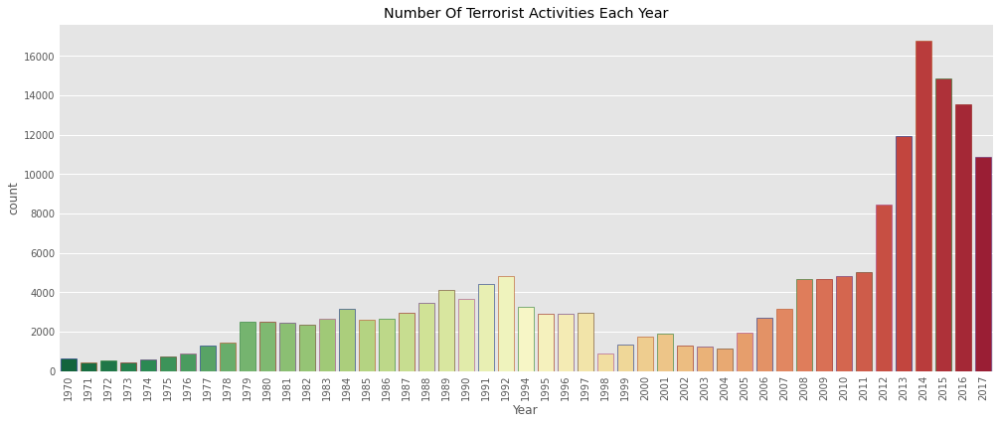

In [9]:
plt.subplots(figsize=(15,6))
sns.countplot('Year',data=data,palette='RdYlGn_r',edgecolor=sns.color_palette('dark',7))
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

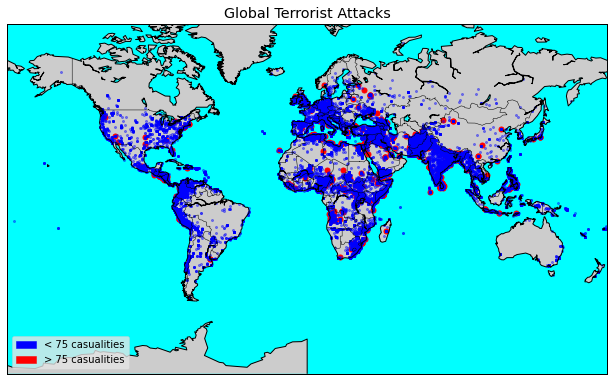

In [10]:
m3 = Basemap(projection='mill',llcrnrlat=-80,urcrnrlat=80, llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c',lat_0=True,lat_1=True)
lat_100=list(data[data['casualities']>=75].latitude)
long_100=list(data[data['casualities']>=75].longitude)
x_100,y_100=m3(long_100,lat_100)
m3.plot(x_100, y_100,'go',markersize=5,color = 'r')
lat_=list(data[data['casualities']<75].latitude)
long_=list(data[data['casualities']<75].longitude)
x_,y_=m3(long_,lat_)
m3.plot(x_, y_,'go',markersize=2,color = 'b',alpha=0.4)
m3.drawcoastlines()
m3.drawcountries()
m3.fillcontinents(lake_color='aqua')
m3.drawmapboundary(fill_color='aqua')
fig=plt.gcf()
fig.set_size_inches(10,6)
plt.title('Global Terrorist Attacks')
plt.legend(loc='lower left',handles=[mpatches.Patch(color='b', label = "< 75 casualities"),
                    mpatches.Patch(color='red',label='> 75 casualities')])
plt.show()

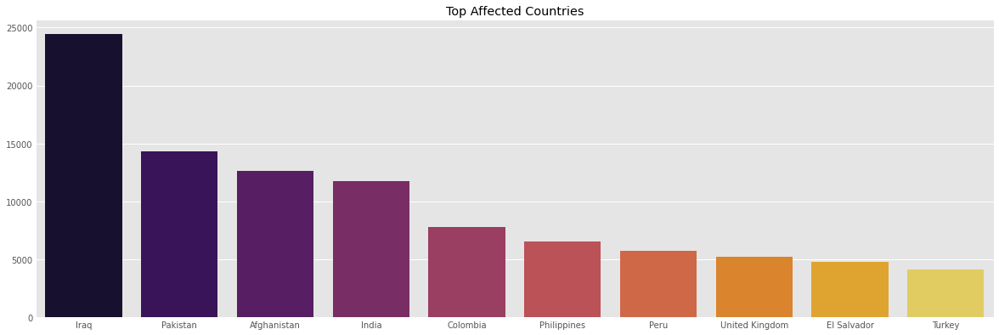

In [11]:
plt.subplots(figsize=(18,6))
sns.barplot(data['Country'].value_counts()[:10].index,data['Country'].value_counts()[:10].values,palette='inferno')
plt.title('Top Affected Countries')
plt.show()

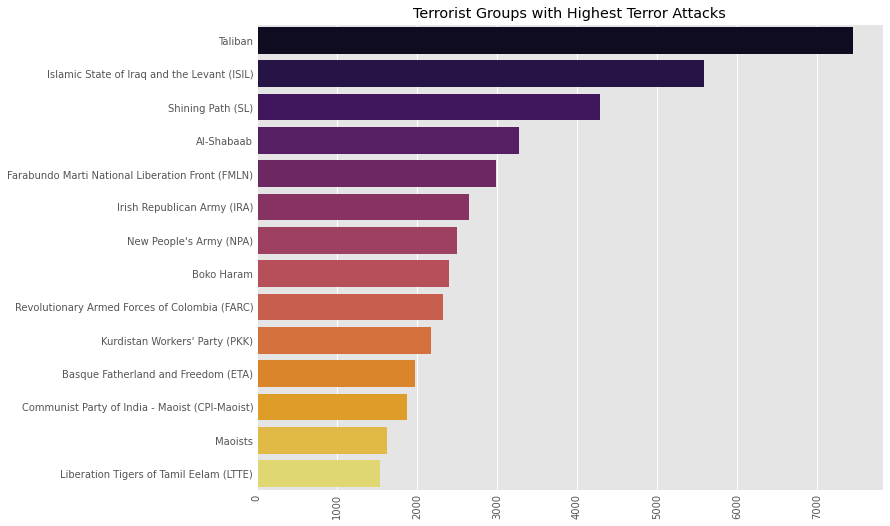

In [12]:
sns.barplot(data['Group'].value_counts()[1:15].values,data['Group'].value_counts()[1:15].index,palette=('inferno'))
plt.xticks(rotation=90)
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.title('Terrorist Groups with Highest Terror Attacks')
plt.show()

In [13]:
terror_fol=data.copy()
terror_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_fol=terror_fol[['latitude','longitude']][:5000]
country_fol=terror_fol['Country'][:5000]
city_fol=terror_fol['city'][:5000]
killed_fol=terror_fol['Killed'][:5000]
wound_fol=terror_fol['Wounded'][:5000]
def color_point(x):
    if x>=30:
        color='red'
    elif ((x>0 and x<30)):
        color='blue'
    else:
        color='green'
    return color   
def point_size(x):
    if (x>30 and x<100):
        size=2
    elif (x>=100 and x<500):
        size=8
    elif x>=500:
        size=16
    else:
        size=0.5
    return size   
map2 = folium.Map(location=[30,0],tiles='CartoDB dark_matter',zoom_start=2)
for point in location_fol.index:
    info='<b>Country: </b>'+str(country_fol[point])+'<br><b>City: </b>: '+str(city_fol[point])+'<br><b>Killed </b>: '+str(killed_fol[point])+'<br><b>Wounded</b> : '+str(wound_fol[point])
    iframe = folium.IFrame(html=info, width=200, height=200)
    folium.CircleMarker(list(location_fol.loc[point].values),popup=folium.Popup(iframe),radius=point_size(killed_fol[point]),color=color_point(killed_fol[point])).add_to(map2)
map2



In [14]:
terror_turkey=data[data['Country']=='Turkey']
terror_turkey_fol=terror_turkey.copy()
terror_turkey_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_turkey=terror_turkey_fol[['latitude','longitude']][:5000]
city_turkey=terror_turkey_fol['city'][:5000]
killed_turkey=terror_turkey_fol['Killed'][:5000]
wound_turkey=terror_turkey_fol['Wounded'][:5000]
target_turkey=terror_turkey_fol['Target_type'][:5000]

In [15]:
map4 = folium.Map(location=[40.59, 40.96],tiles='CartoDB dark_matter',zoom_start=4.5)
for point in location_turkey.index:
    folium.CircleMarker(list(location_turkey.loc[point].values),popup='<b>City: </b>'+str(city_turkey[point])+'<br><b>Killed: </b>'+str(killed_turkey[point])+\
                        '<br><b>Injured: </b>'+str(wound_turkey[point])+'<br><b>Target: </b>'+str(target_turkey[point]),radius=point_size(killed_turkey[point]),color=color_point(killed_turkey[point]),fill_color=color_point(killed_turkey[point])).add_to(map4)
map4

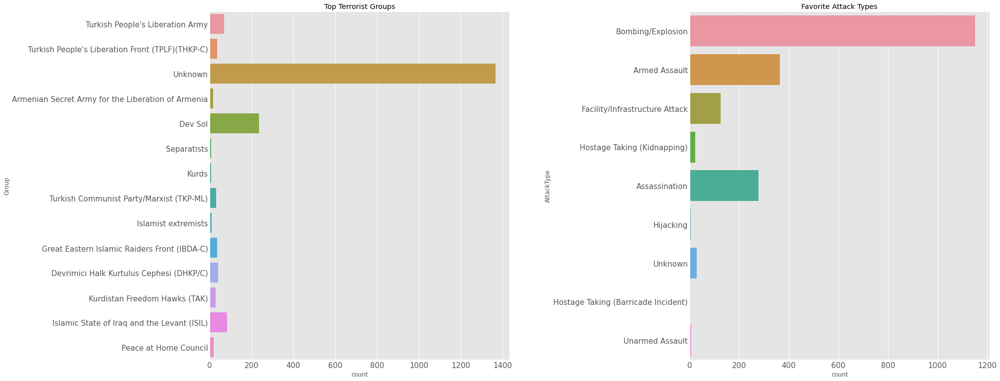

In [16]:
f,ax=plt.subplots(1,2,figsize=(25,12))
turkey_groups=terror_turkey['Group'].value_counts()[1:15].index         # ilk 10 terror gruplari
turkey_groups=terror_turkey[terror_turkey['Group'].isin(turkey_groups)]
sns.countplot(y='Group',data=turkey_groups,ax=ax[0])
sns.countplot(y='AttackType',data=turkey_groups,ax=ax[1])
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].set_title('Top Terrorist Groups')
ax[1].set_title('Favorite Attack Types')
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()

MovieWriter imagemagick unavailable; using Pillow instead.



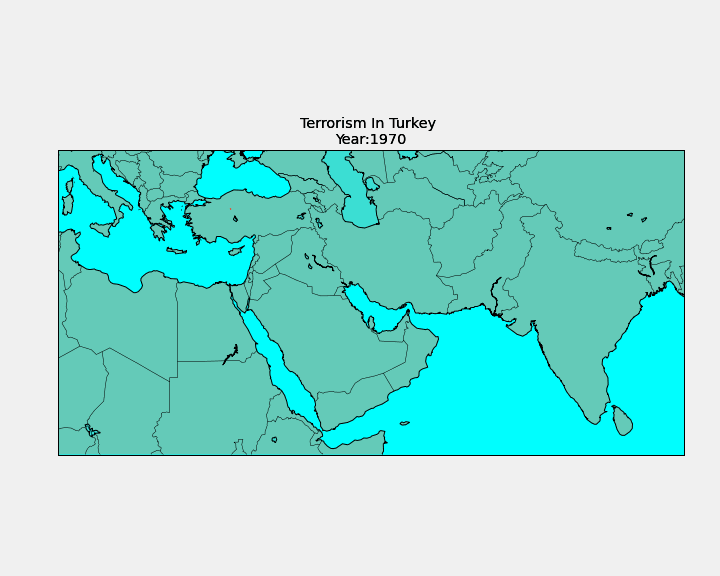

In [17]:
fig = plt.figure(figsize = (10,8))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Terrorism In Turkey '+'\n'+'Year:' +str(Year))
    m5 = Basemap(projection='lcc',resolution='l',llcrnrlon=10,llcrnrlat=10,urcrnrlon=99,urcrnrlat=37,lat_0=15,lon_0=25)
    lat_gif=list(terror_turkey[terror_turkey['Year']==Year].latitude)
    long_gif=list(terror_turkey[terror_turkey['Year']==Year].longitude)
    x_gif,y_gif=m5(long_gif,lat_gif)
    m5.scatter(x_gif, y_gif,s=[killed+wounded for killed,wounded in zip(terror_turkey[terror_turkey['Year']==Year].Killed,terror_turkey[terror_turkey['Year']==Year].Wounded)],color = 'r')
    m5.drawcoastlines()
    m5.drawcountries()
    m5.fillcontinents(color='coral',lake_color='aqua', zorder = 1,alpha=0.4)
    m5.drawmapboundary(fill_color='aqua')
ani = animation.FuncAnimation(fig,animate,list(terror_turkey.Year.unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

MovieWriter imagemagick unavailable; using Pillow instead.



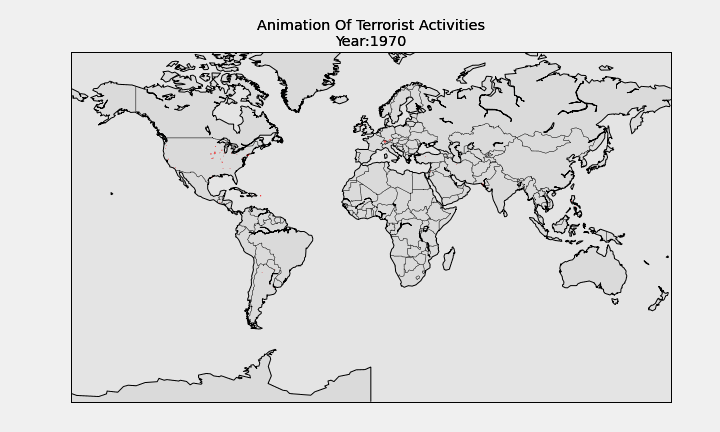

In [18]:
fig = plt.figure(figsize = (10,6))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Animation Of Terrorist Activities'+'\n'+'Year:' +str(Year))
    m6 = Basemap(projection='mill',llcrnrlat=-80,urcrnrlat=80, llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
    lat6=list(data[data['Year']==Year].latitude)
    long6=list(data[data['Year']==Year].longitude)
    x6,y6=m6(long6,lat6)
    m6.scatter(x6, y6,s=[(kill+wound)*0.1 for kill,wound in zip(data[data['Year']==Year].Killed,data[data['Year']==Year].Wounded)],color = 'r')
    m6.drawcoastlines()
    m6.drawcountries()
    m6.fillcontinents(zorder = 1,alpha=0.4)
    m6.drawmapboundary()
ani = animation.FuncAnimation(fig,animate,list(data.Year.unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))